### STAGE 1
 

The dataset generation code is inside the the folder utilis/generate_dataset.py

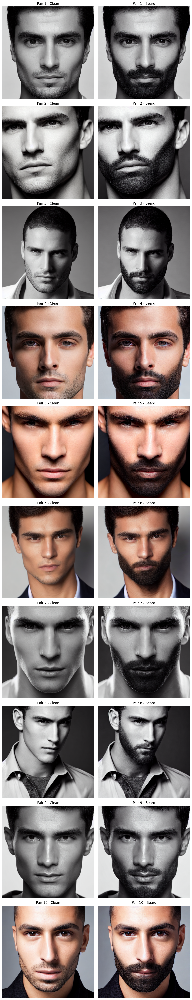

In [17]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import random 
from utils.dataset_visualisation import preview_image_pairs
DATASET_PATH = "dataset"
preview_image_pairs()

## STAGE 2 

In [3]:
from training.train import train_model
from utils.beard_dataset import BeardDataset, transform
from torch.utils.data import DataLoader
from models.unet_generator import UNetGenerator
from models.patchgan_discriminator import PatchGANDiscriminator
import torch
from testing.test import test_model
from models.unet_generator import UNetGenerator
from utils.beard_dataset import BeardDataset, transform
from torch.utils.data import DataLoader
import torch

/Users/gokcemkamisli/Desktop/appnotion_case/venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [24]:
# parameters 

BATCH_SIZE = 4
NUM_EPOCHS = 50
DEVICE = torch.device("cpu")

# dataset loading
dataset = BeardDataset(DATASET_PATH, transform=transform)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

# instantiation generator and discriminator 
generator = UNetGenerator()
discriminator = PatchGANDiscriminator()

# calling training function 
train_model(generator, discriminator, dataloader, num_epochs=NUM_EPOCHS, device=DEVICE)

Epoch [1/50] Batch 0/25 Loss_D: 0.5216, Loss_G: 51.8253
Epoch [1/50] Batch 10/25 Loss_D: 0.2184, Loss_G: 17.9765
Epoch [1/50] Batch 20/25 Loss_D: 0.2481, Loss_G: 15.2572
Epoch [2/50] Batch 0/25 Loss_D: 0.2429, Loss_G: 12.3737
Epoch [2/50] Batch 10/25 Loss_D: 0.2001, Loss_G: 10.3601
Epoch [2/50] Batch 20/25 Loss_D: 0.1969, Loss_G: 10.9909
Epoch [3/50] Batch 0/25 Loss_D: 0.1914, Loss_G: 10.2013
Epoch [3/50] Batch 10/25 Loss_D: 0.2030, Loss_G: 9.5209
Epoch [3/50] Batch 20/25 Loss_D: 0.2223, Loss_G: 8.6540
Epoch [4/50] Batch 0/25 Loss_D: 0.2008, Loss_G: 8.5344
Epoch [4/50] Batch 10/25 Loss_D: 0.2083, Loss_G: 9.4771
Epoch [4/50] Batch 20/25 Loss_D: 0.2020, Loss_G: 8.2456
Epoch [5/50] Batch 0/25 Loss_D: 0.2125, Loss_G: 8.5743
Epoch [5/50] Batch 10/25 Loss_D: 0.1895, Loss_G: 7.8723
Epoch [5/50] Batch 20/25 Loss_D: 0.1951, Loss_G: 9.1246
Epoch [6/50] Batch 0/25 Loss_D: 0.1924, Loss_G: 9.0309
Epoch [6/50] Batch 10/25 Loss_D: 0.2121, Loss_G: 8.0007
Epoch [6/50] Batch 20/25 Loss_D: 0.1925, Loss_G

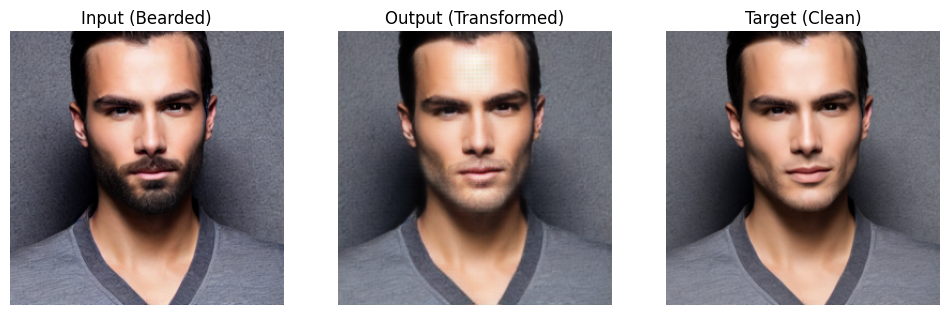

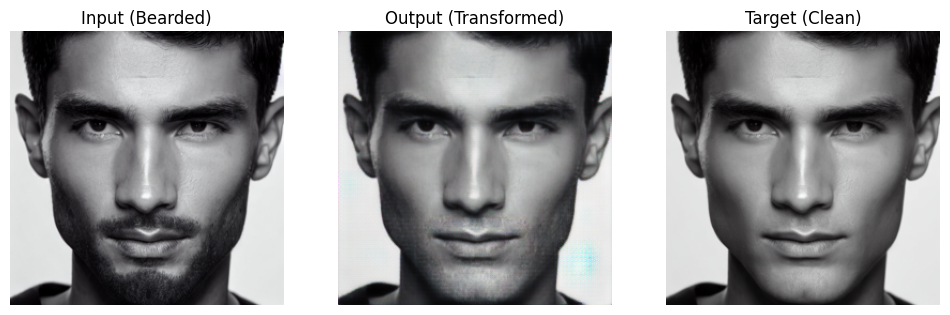

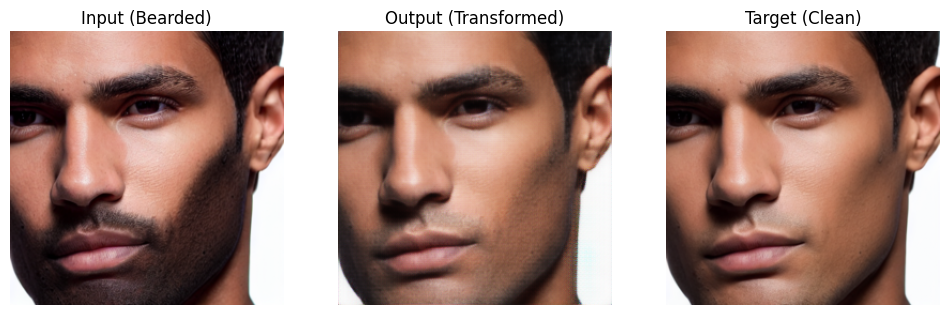

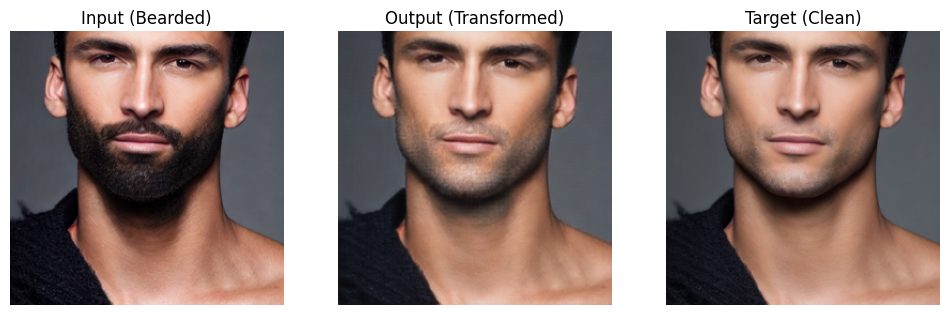

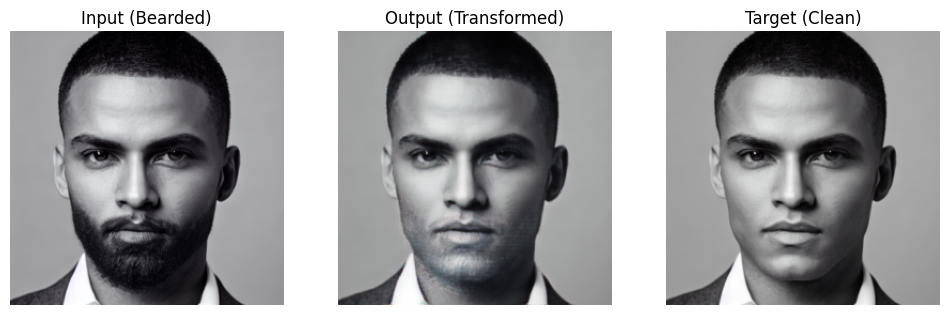

In [41]:
# calling the test function 
test_model(generator, dataloader, device=DEVICE) 

1) Model Evaluation Questions 


- I  would evaluated the model by comparing generated images with the target clean images both quantitatively and qualitatively. I would  measured SSIM and PSNR to assess structural similarity and pixel-level errors, and I also visually inspected outputs for residual beard artifacts and smoothness also I would chose SSIM because it captures structural integrity and PSNR for its sensitivity to noise. Together, they provide a balanced view of image quality and fidelity to the target.


2) Challanges 

- My old, non-GPU computer made image generation with Stable Diffusion extremely slow. Generating even a small dataset of paired images took hours, requiring me to generate images in small batches (often overnight) and carefully manage limited computational resources. Limited hardware forced me to use a small batch size and lower resolution. Additionally, balancing the generator and discriminator was tricky, so I integrated label smoothing and updated the generator twice per iteration to ensure stable training.

- For dataset creation, I scheduled image generation during off-peak hours and broke the process into manageable batches. During training, I optimized the code by using label smoothing (real labels at 0.9) and performing extra generator updates to counterbalance a strong discriminator.


3) Future Improvements 

- With unlimited resources, I’d train on higher-resolution images (e.g., 512×512 or 1024×1024) to capture fine-grained facial details and textures that are lost at lower resolutions.

- I’d upgrade to architectures like Pix2PixHD featuring multi-scale discriminators and incorporate perceptual losses (VGG-based or LPIPS) to enhance both global consistency and local 
texture fidelity.

- I’d leverage larger batch sizes and distributed training across multiple GPUs, using advanced optimizers like AdamW with cosine annealing or warm restarts to improve convergence and stability.

- I’d significantly increase dataset diversity through extensive data augmentation and synthetic data generation, ensuring the model generalizes well across varied facial features and lighting conditions.